#DEEP LEARNING MODELS

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt
import seaborn as sns

import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from textblob import TextBlob
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
sto_word = list(set(stopwords.words('english')))
from nltk.stem import WordNetLemmatizer  # lemmatizer

from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.util import ngrams

pd.set_option('mode.chained_assignment', None)

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import MiniBatchKMeans
import plotly.express as px

import pickle

from sklearn.metrics import hamming_loss, recall_score, precision_score, f1_score

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
import pickle
#pickle.dump((combined_data_fe), open('/content/gdrive/MyDrive/cs1/combined_data_fe.pkl','wb'))
combined_data_fe = pickle.load(open('/content/gdrive/MyDrive/cs1/combined_data_fe4.pkl', 'rb'))
fastext_dict     = pickle.load(open('/content/gdrive/MyDrive/cs1/data/ft/fastext_dict.pkl', 'rb'))

In [ ]:
combined_data_fe.head()

,description,commenting,ogling,grouping,noun_count,punctuation_count,stopword_count,p_or_a,idf_freqently,idf_rare,1_2_3_4gm,description_len,word_count,word_density
0,walking along crowded street holding mum hand ...,0,0,1,8,6,15,1,1,0,19,101,17,5.611111
1,incident took place evening metro two guy star...,0,1,0,5,2,7,1,1,0,22,57,9,5.700000
2,waiting bus man came bike offering liftvto you...,1,0,0,5,2,9,1,1,0,13,54,9,5.400000
3,incident happened inside train,0,0,0,2,0,1,1,1,0,5,30,4,6.000000
4,witnessed incident chain brutally snatched eld...,0,0,0,7,2,9,1,1,0,19,83,11,6.916667


In [ ]:
y = combined_data_fe[['commenting', 'ogling', 'grouping']]
combined_data_fe.drop(['commenting', 'ogling', 'grouping'], axis=1, inplace=True)
x = combined_data_fe

In [ ]:
x.shape, y.shape

((9193, 11), (9193, 3))

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, test_size=0.20, random_state=42)

In [ ]:
print(f'x train shape {x_train.shape}')
print(f'y train shape {y_train.shape}')
print(f'x test shape  {x_test.shape}')
print(f'y test shape  {y_test.shape}')

x train shape (7354, 11)
y train shape (7354, 3)
x test shape  (1839, 11)
y test shape  (1839, 3)


In [ ]:
def exact_match_ratio(y_true, y_pred):
  emr = np.all(y_true == y_pred, axis=1).mean()
  return emr

In [ ]:
from sklearn.metrics import hamming_loss, recall_score, precision_score, f1_score

def metrics(y_true, y_pred,):
  
  print("Hamming Loss      : ", hamming_loss(y_true, y_pred))
  print("Exact Match Ratio : ", exact_match_ratio(y_true, y_pred))
  print("Recall micro      : ", recall_score(y_true, y_pred, average='micro'))
  print("Precision micro   : ", precision_score(y_true, y_pred, average='micro'))
  print("Fl score micro    : ", f1_score(y_true, y_pred, average='micro'))
  print(" ")
  print("Recall macro      : ", recall_score(y_true, y_pred, average='macro'))
  print("Precision macro   : ", precision_score(y_true, y_pred, average='macro'))
  print("Fl score macro    : ", f1_score(y_true, y_pred, average='macro'))


In [ ]:
import tensorflow as tf
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences

def pad_vocab(train, test, column):

  '''train/test : frame
     column     : text column
     returns    : trian/test values, train/test padding, vocab size, word index, tokizer'''

  # text data 
  train_text =list(train[column].values)
  test_text = list(test[column].values)

  # tokenize the Text data
  tokenizer = Tokenizer()
  # fit on train data
  tokenizer.fit_on_texts(train_text)     
  # transform train and test data
  train_description_sequences = tokenizer.texts_to_sequences(train_text)
  test_description_sequences = tokenizer.texts_to_sequences(test_text)

  # vocabulary size 
  vocab_size = len(tokenizer.word_index) + 1
  
  word_index_e = tokenizer.word_index
  # pad the sequnce

  train_pad = pad_sequences(
        train_description_sequences, maxlen=300, dtype='int32', padding='post',  
        truncating='post')                                                  

  test_pad = pad_sequences(
        test_description_sequences, maxlen=300, dtype='int32', padding='post', 
        truncating='post')
  
  return train_text, test_text, train_pad, test_pad, vocab_size, word_index_e, tokenizer

In [ ]:
train_text, test_text, train_pad, test_pad, vocab_size, word_index, tokenizer  =  pad_vocab(x_train, x_test, 'description')

#FASTEXT

###Fastext THEORY

1. Fastext allows to learn representation of words and sentences which can be used for various task, here we used it as transfer learning (embedding of words/sentences to fed into model).

2. in fastext each word is represented as bag of character n-grams in addition to the word itself ex word sponge with n = 3, fastext representation are <sp, spo, pon, ong, nge, ge>, if pon is part of vocablary it is represented as < pon > i.e  distinguishing word and its ngram this helps to preserves word whichare short and can be occur later in sentences so its ngram can be used as reference, during traning it learns weights for ngrams (subwords) as well for entire word token.

3. models on which fastext trained is skipgram or cbow, here used is skipgram
skipgram is used to predict the context word for a given target word. Here, target word is input while context words are output, simply put it tries to find most relatable word for a given word.

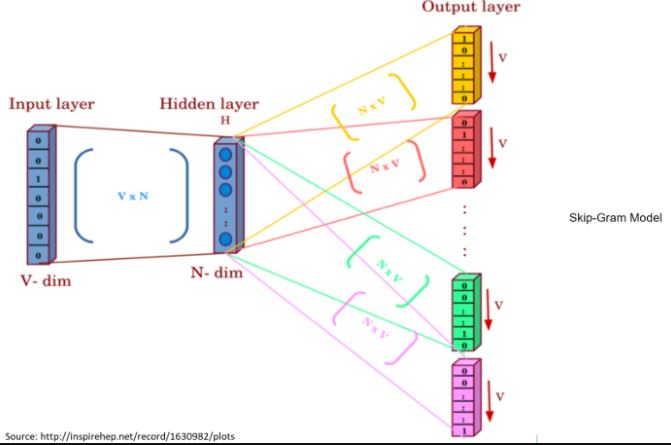

example 

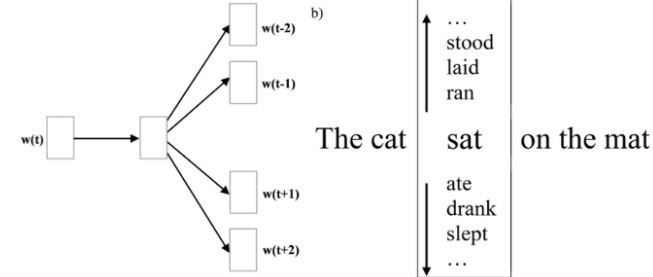

4. fastext supports negative sampling, or hierarchical softmax as loss functions, here used is negative sampling.

5. Why need negative sampling?

Let suppose vocab = 10000 and hidden layer is 300 dimesions total parameter we will have for single token update is 10000x300 = 3M, and updating 3M parameter for every token is computationally expensive, so negative sampling addresses this issue by updating only a small fraction of the output neurons for each training sample, typicall range for this is 5-20.

it encompasses sigmod function as binary classification task of actual context word (positive) and randomly drawn word (negative), simple idea is that if able to seperate postive to negative word vectors learned are good enough. 

with negative sampling objective becomes, whether the word (c) is in the context window of the the center word (w) or not.

The probability of a word (c) appearing within the context of the center word (w) can be defined as,

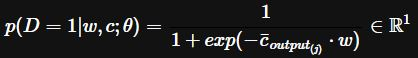 

where c is word came from postive or negative word context,
w = input center word, 
thetha = weight matrix having dim. of input x hidden layer (no. of neurons), 
c_output = wt. embedding matrix of output word

since vanilla skipgram have v(vocab words) so complexity is o(v) but negative sampling has complexity of o(k+1) where k is negative samples which is less than v, i.e. why negative sampling saves a significant amount of computational cost per iteration.

6. algo rejects words based on certain threshold calculated as,
 p(w) = sqrt(t/f(w)) + t/f(w), where f(w) = count/total no. of tokens, 
 normally t is takena as 10e-5

7. negative words are taken following the distribution as below

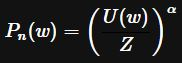

where U(w) is unigram distribution i.e how many times each word appeared in a corpus,
z = normalization factor, each word w divides by no. of time it appear in corpus (normaliztion),
alpha = hyperparam normally taken as 3/4 accor. to paper.

8. derivative of negative sampling in network


where,
c_pos = words that actually appear within the context window of the center word (w)

c_neg = words that are randomly drawn from a noise distribution Pn(w) or negative sampling,

w = word vector of input word which is equal to hidden layer (neuron) h, 
i.e. h is obtained by multiplying the input word embedding matrix (let, 3) with the V-dim input vector (let, 10) so final shape is (10,) x (10,3) = 3 (hidden state).

theta = concat of input and output wt. matrices

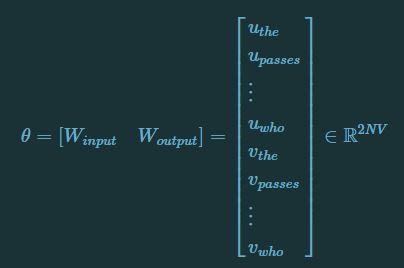

 u is a word vector from w_input and v is a word vector from w_output.









###WORKING

In [ ]:
from gensim.models.fasttext import FastText
import nltk
def fast_model(embed_size, window_size, min_words, down_sampling):

  """embedding_size :  size of the embedding vector. 
  window_size       :  size of the number of words occurring before and after the word based on which the word representations.
  min_word          :  minimum frequency of a word in the corpus for which the word representations will be generated
  down_sampling     :  most frequently occurring word will be down-sampled by a number specified by the down_sampling""" 

  word_punctuation_tokenizer = nltk.WordPunctTokenizer()
  word_tokenized_corpus = [word_punctuation_tokenizer.tokenize(sent) for sent in train_text]
  model = FastText(word_tokenized_corpus, size=embed_size, window=window_size, min_count=min_words, sample=down_sampling, sg=1, iter=100)

  embedding_matrix_fast_text = np.zeros((vocab_size, embed_size))
  for word, i in tokenizer.word_index.items():
    try:
      embedding_vector = model.wv[word] # getting the vector for each word
    except:
      embedding_vector = np.zeros(300)
  
  if embedding_vector is not None:
    embedding_matrix_fast_text[i] = embedding_vector

  return embedding_matrix_fast_text




In [ ]:
%%time 
embedding_matrix_ft = fast_model(300, 20, 5, 1e-2)

CPU times: user 6min 48s, sys: 1.11 s, total: 6min 49s
Wall time: 3min 31s


In [ ]:
#pickle.dump((embedding_matrix_ft), open('/content/gdrive/MyDrive/cs1/deep model final/embedding_matrix_ft.pkl','wb'))
embedding_matrix_ft = pickle.load(open('/content/gdrive/MyDrive/cs1/deep model final/embedding_matrix_ft.pkl','rb'))

In [ ]:
import sys, os, re, csv, codecs
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Input, LSTM, Embedding, Conv1D, concatenate, Flatten, Concatenate
from tensorflow.keras.layers import  BatchNormalization, Dropout, Activation, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from tensorflow.keras.layers import Bidirectional, GlobalMaxPool1D
from tensorflow.keras.models import Model
from tensorflow.keras import initializers, regularizers, constraints, optimizers, layers

from sklearn.metrics import hamming_loss
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

import numpy as np
import pandas as pd

###bi dir. lstm

In [ ]:
def model(embed_matrix, vocab_size, embedd_size,input_length):

  '''embed_matrix   : matrix weight from embedding,
     vocab_size     : length of vocab,
     embedd_size    : size of embedding,
     input lenght   : maximum/custom lenght of text,
     returns        : model'''

  input = Input(shape=(input_length,), name='Descripton text')  # input 
  embedding = Embedding(vocab_size, embedd_size, weights=[embed_matrix], input_length=input_length, trainable=False)(input) 
  x = SpatialDropout1D(0.5)(embedding)
  x0 = Bidirectional(LSTM(128, return_sequences=True, dropout=0.2, recurrent_dropout=0.2))(x)

  #1
  x = Dense(100, activation="relu")(x0)
  #x = GlobalMaxPool1D()(x)
  x = BatchNormalization()(x)
  x = Dropout(0.5)(x)

  #2
  x1 = Dense(100, activation="relu")(x0)
  x1 = BatchNormalization()(x1)
  x1 = Dropout(0.5)(x1)

  x_con =  Concatenate(axis=1)([x,x1])
  x_ = GlobalMaxPool1D()(x_con)
  x_ = Dropout(0.5)(x_)

  output = Dense(3, activation="sigmoid")(x_)

  model = Model(inputs=input, outputs=output)
  return model

#model.summary()

In [ ]:
model_1_ft = model(embedding_matrix_ft, vocab_size, 300, 300)
model_1_ft.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Descripton text (InputLayer)    [(None, 300)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 300, 300)     2420100     Descripton text[0][0]            
__________________________________________________________________________________________________
spatial_dropout1d (SpatialDropo (None, 300, 300)     0           embedding[0][0]                  
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 300, 256)     439296      spatial_dropout1d[0][0]          
______________________________________________________________________________________________

In [ ]:
def class_conversion(array):   

  '''take array as input convert probablity to label based on threshold of 0.5'''

  row, column = array.shape
  predict =np.zeros((row, column))
  for i in range(row):
    for j in range(column):
      if array[i,j]>0.5:
        predict[i,j] = 1
  return predict

In [ ]:
from tensorflow.keras.callbacks import *

filepath = '/content/gdrive/MyDrive/cs1/deep_model1_ft.hdf5'
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1,save_best_only=True, mode='auto', save_freq='epoch')

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
model_1_ft.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=[tf.keras.metrics.BinaryAccuracy()])

hstry = model_1_ft.fit(train_pad, y_train, batch_size=64, epochs=12, validation_data=(test_pad, y_test), callbacks=[checkpoint])

Epoch 1/12
115/115 [==============================] - 397s 3s/step - loss: 2.5189 - binary_accuracy: 0.6354 - val_loss: 0.5973 - val_binary_accuracy: 0.7022

Epoch 00001: val_loss improved from inf to 0.59733, saving model to /content/gdrive/MyDrive/cs1/deep_model1_ft.hdf5
Epoch 2/12
115/115 [==============================] - 387s 3s/step - loss: 0.6808 - binary_accuracy: 0.6574 - val_loss: 0.5978 - val_binary_accuracy: 0.7022

Epoch 00002: val_loss did not improve from 0.59733
Epoch 3/12
115/115 [==============================] - 390s 3s/step - loss: 0.6256 - binary_accuracy: 0.6917 - val_loss: 0.6012 - val_binary_accuracy: 0.7091

Epoch 00003: val_loss did not improve from 0.59733
Epoch 4/12
115/115 [==============================] - 388s 3s/step - loss: 0.5981 - binary_accuracy: 0.7115 - val_loss: 0.5777 - val_binary_accuracy: 0.7212

Epoch 00004: val_loss improved from 0.59733 to 0.57774, saving model to /content/gdrive/MyDrive/cs1/deep_model1_ft.hdf5
Epoch 5/12
115/115 [==========

In [ ]:
score = model_1_ft.evaluate(test_pad, y_test, verbose=1)
print("Loss         :", score[0])
print("Bin. Accuracy:", score[1])

58/58 [==============================] - 18s 317ms/step - loss: 0.4876 - binary_accuracy: 0.8294
Loss         : 0.48764151334762573
Bin. Accuracy: 0.8294363021850586


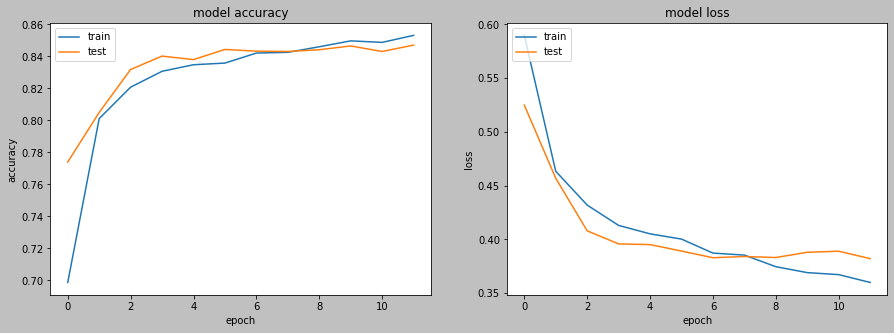

In [ ]:
import matplotlib.pyplot as plt

def plot_los():
  fig = plt.figure(figsize=(15, 5)).patch.set_facecolor('silver')
  plt.subplot(121)

  plt.plot(hstry.history['binary_accuracy'])
  plt.plot(hstry.history['val_binary_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  
  plt.subplot(122)
  plt.plot(hstry.history['loss'])
  plt.plot(hstry.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

plot_los()

**OBSERVATION**

1. initially in epoch loss curve training loss is higher than validation loss that means underftting, which is quite evident as it is starting stage, but after epoch 7, validation loss is higher than training loss indicates model starts overftting, but epoch 7 is the best balance we are looking for.

In [ ]:
y_pred = model_1_ft.predict(test_pad, batch_size=64)
y_class = class_conversion(y_pred)

In [ ]:
y_class

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.],
       ...,
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [ ]:
metrics(y_test, y_class)

Hamming Loss      :  0.1705637121624071
Exact Match Ratio :  0.610657966286025
Recall micro      :  0.5003043213633597
Precision micro   :  0.8726114649681529
Fl score micro    :  0.6359767891682785
 
Recall macro      :  0.4707705417414137
Precision macro   :  0.861443355701792
Fl score macro    :  0.5954439073166472


In [ ]:
model_1_ft.save('/content/gdrive/MyDrive/cs1/model1_ft_deepl.h5')

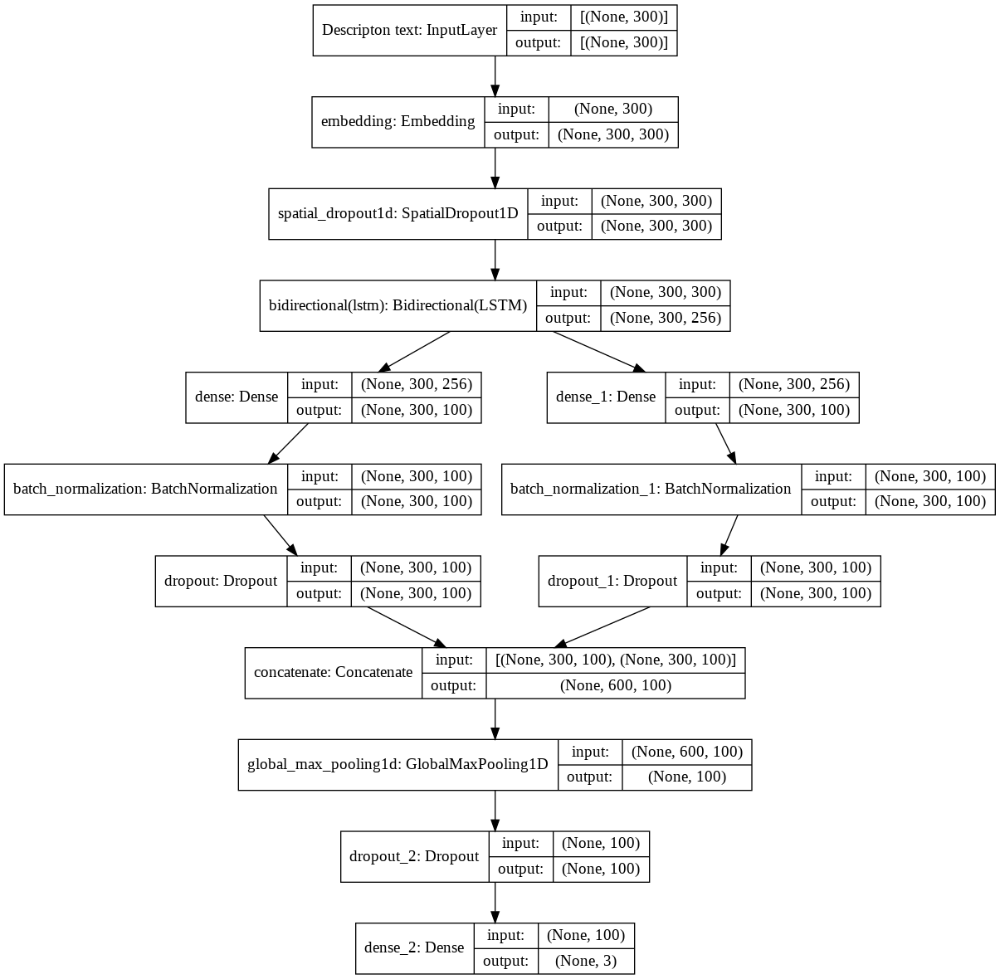

In [ ]:
tf.keras.utils.plot_model( model_1_ft, show_shapes=True, show_layer_names=True, rankdir="TB", expand_nested=False, dpi=96)

###cnn 1d

In [ ]:

def model2ft(embed_matrix, vocab_size, embedd_size,input_length):
  input = Input(shape=(300,), name='Descripton text cnn1d')  # input 

  embedding = Embedding(vocab_size, embedd_size, weights=[embed_matrix], input_length=embedd_size, trainable=False)(input)  # embedding layer

  x = SpatialDropout1D(0.5)(embedding)
  conv0 = Conv1D(128, 6, activation="relu")(x)
  z = GlobalMaxPool1D()(conv0)

  conv1 = Conv1D(128, 6, activation="relu")(x)
  x1 = GlobalMaxPool1D()(conv1)

  x1 = Concatenate()([x1,z])

  x2 = Dropout(0.5)(x1)

  output = Dense(3, activation="sigmoid")(x2)

  model_2_ft = Model(inputs=input, outputs=output)

  return model_2_ft

  #model_2_ft.summary()

In [ ]:
model_2_ft = model2ft(embedding_matrix_ft, vocab_size, 300, 300)
model_2_ft.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Descripton text cnn1d (InputLay [(None, 300)]        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 300, 300)     2420100     Descripton text cnn1d[0][0]      
__________________________________________________________________________________________________
spatial_dropout1d_1 (SpatialDro (None, 300, 300)     0           embedding_1[0][0]                
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 295, 128)     230528      spatial_dropout1d_1[0][0]        
____________________________________________________________________________________________

In [ ]:
from tensorflow.keras.callbacks import *

filepath = '/content/gdrive/MyDrive/cs1/deep_model2_ft.hdf5'
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1,save_best_only=True, mode='auto', save_freq='epoch')

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
model_2_ft.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=[tf.keras.metrics.BinaryAccuracy()])

hstry1 = model_2_ft.fit(train_pad, y_train, batch_size=64, epochs=12, validation_data=(test_pad, y_test), callbacks=[checkpoint])

Epoch 1/12
115/115 [==============================] - 96s 825ms/step - loss: 0.5673 - binary_accuracy: 0.7360 - val_loss: 0.4686 - val_binary_accuracy: 0.8039

Epoch 00001: val_loss improved from inf to 0.46864, saving model to /content/gdrive/MyDrive/cs1/deep_model2_ft.hdf5
Epoch 2/12
115/115 [==============================] - 94s 822ms/step - loss: 0.4764 - binary_accuracy: 0.7891 - val_loss: 0.4429 - val_binary_accuracy: 0.8227

Epoch 00002: val_loss improved from 0.46864 to 0.44287, saving model to /content/gdrive/MyDrive/cs1/deep_model2_ft.hdf5
Epoch 3/12
115/115 [==============================] - 94s 820ms/step - loss: 0.4425 - binary_accuracy: 0.8113 - val_loss: 0.4281 - val_binary_accuracy: 0.8249

Epoch 00003: val_loss improved from 0.44287 to 0.42810, saving model to /content/gdrive/MyDrive/cs1/deep_model2_ft.hdf5
Epoch 4/12
115/115 [==============================] - 95s 823ms/step - loss: 0.4231 - binary_accuracy: 0.8200 - val_loss: 0.4221 - val_binary_accuracy: 0.8363

Epoc

In [ ]:
score = model_2_ft.evaluate(test_pad, y_test, verbose=1)
print("Loss         :", score[0])
print("Bin. Accuracy:", score[1])

58/58 [==============================] - 9s 157ms/step - loss: 0.4107 - binary_accuracy: 0.8394
Loss         : 0.4107370674610138
Bin. Accuracy: 0.8394055366516113


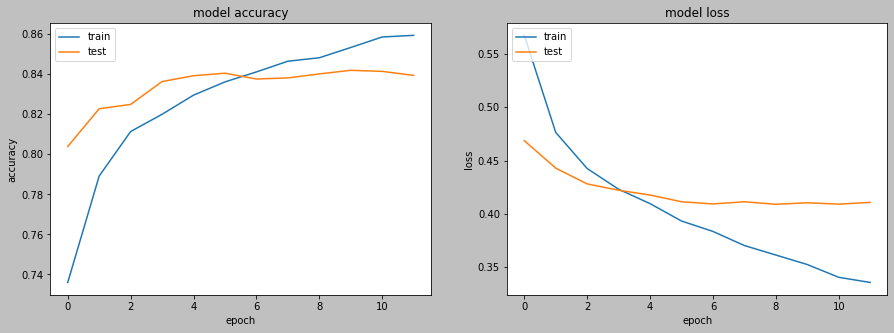

In [ ]:
import matplotlib.pyplot as plt

def plot_los():
  fig = plt.figure(figsize=(15, 5)).patch.set_facecolor('silver')
  plt.subplot(121)

  plt.plot(hstry1.history['binary_accuracy'])
  plt.plot(hstry1.history['val_binary_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  
  plt.subplot(122)
  plt.plot(hstry1.history['loss'])
  plt.plot(hstry1.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

plot_los()

**OBSERVATION**

1. initially in epoch loss curve training loss is higher than validation loss that means underftting, which is quite evident as it is starting stage, but after epoch 3, validation loss higher than training loss indicates model starts overftting, but epoch 3 is the best balance we
are looking for.

In [ ]:
y_pred = model_2_ft.predict(test_pad, batch_size=64)
y_class = class_conversion(y_pred)

In [ ]:
y_class

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.],
       ...,
       [1., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [ ]:
metrics(y_test, y_class)

Hamming Loss      :  0.16059452601051297
Exact Match Ratio :  0.6296900489396411
Recall micro      :  0.5709068776628119
Precision micro   :  0.838248436103664
Fl score micro    :  0.6792179580014481
 
Recall macro      :  0.543709772250049
Precision macro   :  0.8158412600797383
Fl score macro    :  0.6473652706173126


In [ ]:
model_2_ft.save('/content/gdrive/MyDrive/cs1/model2_ft_deepl.h5')

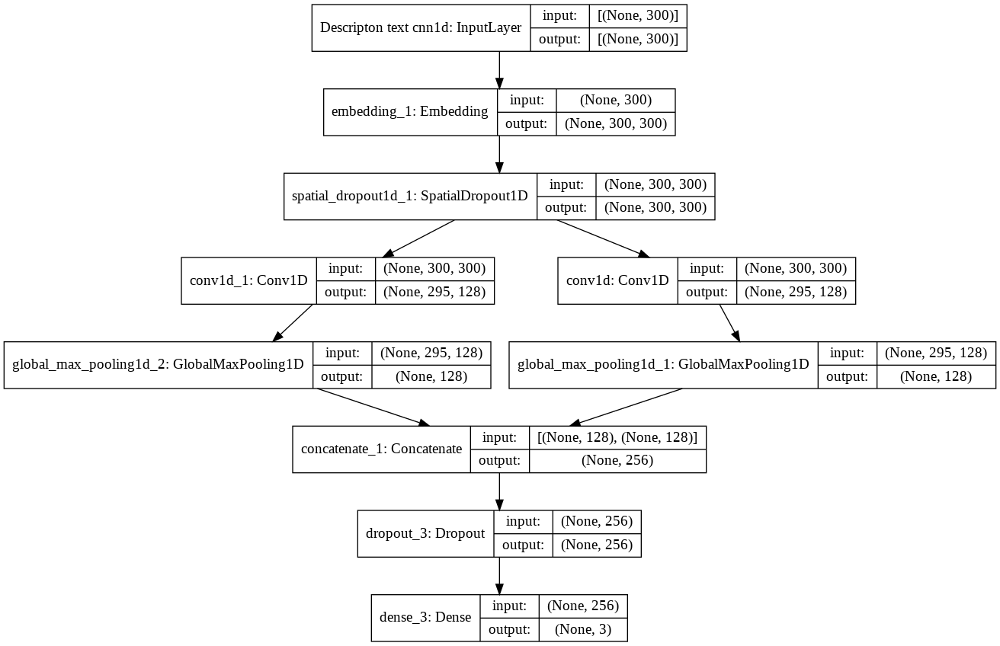

In [ ]:
tf.keras.utils.plot_model( model_2_ft, show_shapes=True, show_layer_names=True, rankdir="TB", expand_nested=False, dpi=96)

###bi dir. and cnn1d

In [ ]:
def model3ft(embed_matrix, vocab_size, embedd_size,input_length):
  input = Input(shape=(input_length,))  # input 
  embedding = Embedding(vocab_size, embedd_size, weights=[embed_matrix], input_length=input_length, trainable=False)(input)  # embedding layer

  x = SpatialDropout1D(0.2)(embedding)

  x = Bidirectional(LSTM(128, return_sequences=True, dropout=0.15, recurrent_dropout=0.15))(x)
  x = Conv1D(64, kernel_size=3, padding='valid', kernel_initializer='glorot_uniform')(x)

  avg_pool = GlobalAveragePooling1D()(x)
  max_pool = GlobalMaxPooling1D()(x)  

  x = concatenate([avg_pool, max_pool])
  x = BatchNormalization()(x)
  x = Dropout(0.2)(x)   
  x = Dense(128, activation='relu')(x)
  x = Dense(64, activation='relu')(x)
  out = Dropout(0.2)(x)   

  output = Dense(3, activation="sigmoid")(out)
  model_3_ft = Model(inputs=input, outputs=output)

  return model_3_ft


In [ ]:
model_3_ft = model3ft(embedding_matrix_ft, vocab_size, 300, 300)
model_3_ft.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 300)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 300, 300)     2420100     input_1[0][0]                    
__________________________________________________________________________________________________
spatial_dropout1d (SpatialDropo (None, 300, 300)     0           embedding[0][0]                  
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 300, 256)     439296      spatial_dropout1d[0][0]          
______________________________________________________________________________________________

In [ ]:
from tensorflow.keras.callbacks import *

filepath = '/content/gdrive/MyDrive//cs1/deep_model3_ft.hdf5'
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1,save_best_only=True, mode='auto', save_freq='epoch')

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
model_3_ft.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=[tf.keras.metrics.BinaryAccuracy()])

hstry2 = model_3_ft.fit(train_pad, y_train, batch_size=64, epochs=12, validation_data=(test_pad, y_test), callbacks=[checkpoint])

Epoch 1/12
115/115 [==============================] - 388s 3s/step - loss: 0.5051 - binary_accuracy: 0.7689 - val_loss: 0.5402 - val_binary_accuracy: 0.8001

Epoch 00001: val_loss improved from inf to 0.54016, saving model to /content/gdrive/MyDrive//cs1/deep_model2_ft.hdf5
Epoch 2/12
115/115 [==============================] - 379s 3s/step - loss: 0.4323 - binary_accuracy: 0.8184 - val_loss: 0.4553 - val_binary_accuracy: 0.8376

Epoch 00002: val_loss improved from 0.54016 to 0.45533, saving model to /content/gdrive/MyDrive//cs1/deep_model2_ft.hdf5
Epoch 3/12
115/115 [==============================] - 378s 3s/step - loss: 0.4120 - binary_accuracy: 0.8304 - val_loss: 0.4014 - val_binary_accuracy: 0.8432

Epoch 00003: val_loss improved from 0.45533 to 0.40136, saving model to /content/gdrive/MyDrive//cs1/deep_model2_ft.hdf5
Epoch 4/12
115/115 [==============================] - 375s 3s/step - loss: 0.3959 - binary_accuracy: 0.8391 - val_loss: 0.3908 - val_binary_accuracy: 0.8421

Epoch 000

In [ ]:
score = model_3_ft.evaluate(test_pad, y_test, verbose=1)
print("Loss         :", score[0])
print("Bin. Accuracy:", score[1])

58/58 [==============================] - 18s 308ms/step - loss: 0.4923 - binary_accuracy: 0.8401
Loss         : 0.4922749996185303
Bin. Accuracy: 0.8401304483413696


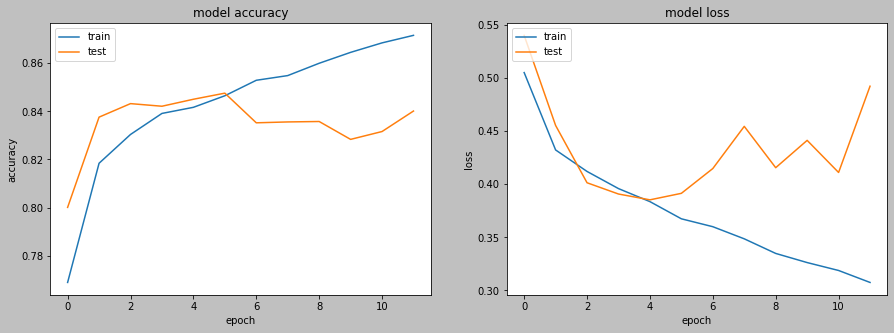

In [ ]:
import matplotlib.pyplot as plt

def plot_los():
  fig = plt.figure(figsize=(15, 5)).patch.set_facecolor('silver')
  plt.subplot(121)

  plt.plot(hstry2.history['binary_accuracy'])
  plt.plot(hstry2.history['val_binary_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  
  plt.subplot(122)
  plt.plot(hstry2.history['loss'])
  plt.plot(hstry2.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

plot_los()

**OBSERVATION**

1. initially in epoch loss curve training loss is lower than validation loss that means overfitting, but after epoch 4, validation loss is higher than training loss indicates model starts overftting, at epoch 2-3 test loss higher than train which indicates marginally underfit but epoch 4 is the best balance we are looking for.

In [ ]:
y_pred = model_3_ft.predict(test_pad, batch_size=64)
y_class = class_conversion(y_pred)

In [ ]:
y_class

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.],
       ...,
       [0., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.]])

In [ ]:
metrics(y_test, y_class)

Hamming Loss      :  0.1598694942903752
Exact Match Ratio :  0.6247960848287113
Recall micro      :  0.5721241631162508
Precision micro   :  0.8400357462019661
Fl score micro    :  0.6806661839246924
 
Recall macro      :  0.5373421564979804
Precision macro   :  0.8200479052453645
Fl score macro    :  0.6345582336404335


In [ ]:
model_3_ft.save('/content/gdrive/MyDrive/cs1/model3_ft_deepl.h5')

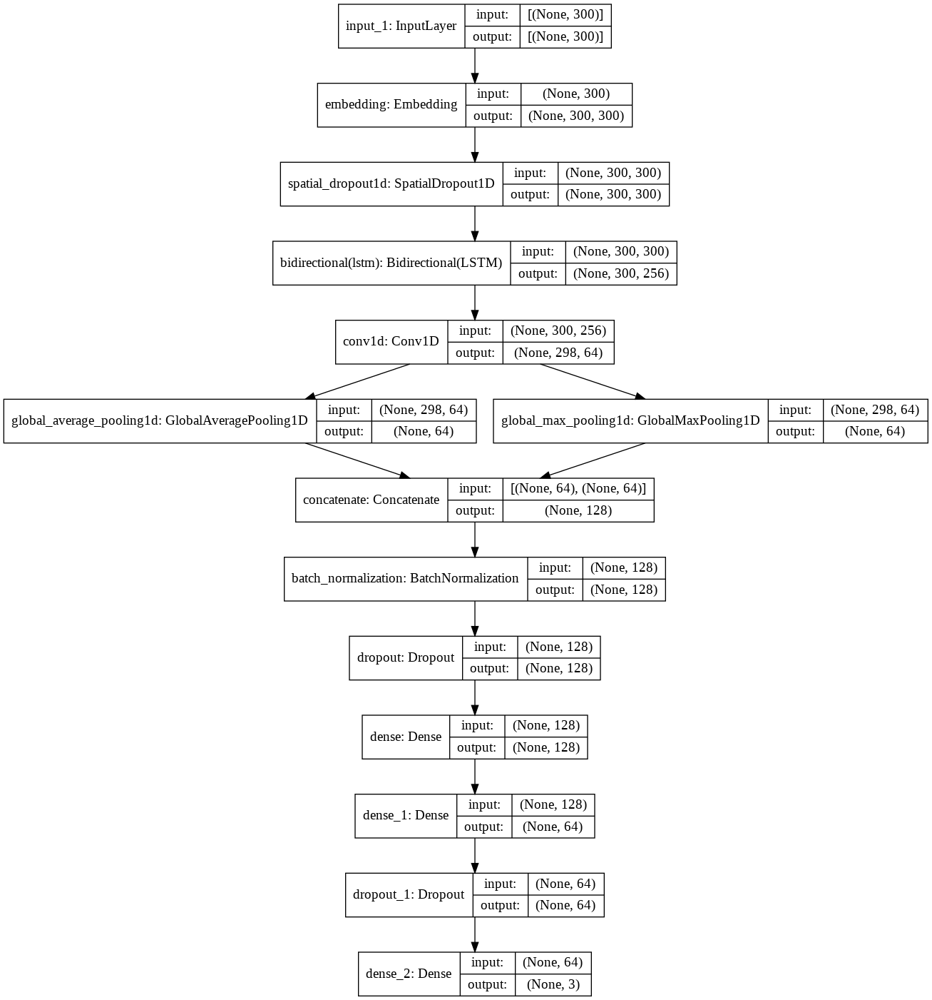

In [ ]:
tf.keras.utils.plot_model( model_3_ft, show_shapes=True, show_layer_names=True, rankdir="TB", expand_nested=False, dpi=96)

#GLOVE

##GLOVE THEORY

1. glove captures global context by using conditional probablity (co-occurance based matrix), i.e. using co-occurance probablity as ratio and use it as word representation.

2. 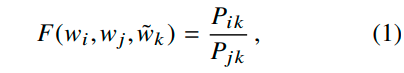

here, w_i, w_j = words in context,
w_tilda_k = whose embedd to be learn,
P_ik = prob. of word i in context of k,
P_jk = prob. of word j in context of k.

aim = learn function F which encapsulates information on right hand side of equation, which info is there in corpus.

3. 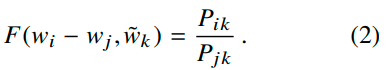

since w_'s are vector, i.e having linear structure as it is vector, so use difference, but other operation can also be used, but it also restricts to differnce of two word (i,j).

4. since in eq 2 rhs is scaler, to have the same dim. we convert lhs also to scaler by taking dot product, which also help to clearly defining loss function.

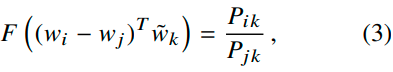 


5. in eq3 let w_tilda_k = pot, i.e. we are learning various word embedding given pot, but this can also be the case that we need embedding of pot w.r.t different w_tilda_k (say sky), so to encode this inter-changibilty we require function F to be homomorphic i.e. we can express as below

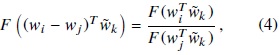

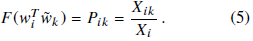


where, X_ik = number of times any word appears (k) in context of word i,
X = word-word co-occurance count mat.


6. after taking log of eq. 5 and adding baises we get 

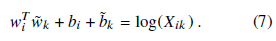

7. on eq 6 using least square regression as loss function (F), and multiplying by weighing function (f(X_ij)) gives overall cost function

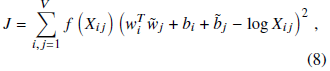

where V = size of vocab
aim of giving weighing function that it should not measure all co-occurances equally i.e not treating same which occurs rarely.

from the paper f(X) is as below

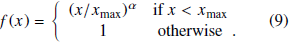

with x_max = 3/4. 

properties of f(X) should kept in mind are
  1.  at f(0) = 0.
  2.  f(X) continous function vanishes as x tends to 0. 
  3.  f(X) non decreasing so that co-occurrences not overweighted. 
  4.  f(X) small for large value of x, so that frequent co-occurences are not overweigth. 

##WORKING MODEL

In [ ]:
import os
path_glove = os.path.join(os.path.expanduser('~'), '/content/gdrive/MyDrive/cs1/deep model final/glove.6B.300d.txt')

def glove_embedding(word_index):
  embedding_index = {}
  hit = 0
  miss = 0
  embedding_matrix = np.zeros((len(word_index)+1, 300))

  with open(path_glove) as f:
    for line in f:
      word, coef = line.split(maxsplit=1)
      coef = np.fromstring(coef, 'float', sep=' ')
      embedding_index[word] = coef
  
  print('Found %s word vectors.' % len(embedding_index))

  for word, i in word_index.items():
    embedding_vector = embedding_index.get(word)
    if embedding_vector is not None:
      ## words not found in embedding index will be all zeros
      embedding_matrix[i] = embedding_vector
      hit += 1
    else:
      miss += 1

  print(f'Converted {hit} words, misses {miss}')

  return embedding_matrix
  

In [ ]:
glove_embed = glove_embedding(word_index)

Found 400000 word vectors.
Converted 6428 words, misses 1638


###bi dir. lstm

In [ ]:
def model(embed_matrix, vocab_size, embedd_size,input_length):
  input = Input(shape=(input_length,), name='Descripton text')  # input 

  embedding = Embedding(vocab_size, embedd_size, weights=[embed_matrix], input_length=input_length, trainable=False)(input) 


  x = SpatialDropout1D(0.5)(embedding)

  x0 = Bidirectional(LSTM(128, return_sequences=True, dropout=0.2, recurrent_dropout=0.2))(x)

  #1
  x = Dense(100, activation="relu")(x0)
  #x = GlobalMaxPool1D()(x)
  x = BatchNormalization()(x)
  x = Dropout(0.5)(x)

  #2
  x1 = Dense(100, activation="relu")(x0)
  #x1 = GlobalMaxPool1D()(x1)
  x1 = BatchNormalization()(x1)
  x1 = Dropout(0.5)(x1)


  x_con =  Concatenate(axis=1)([x,x1])
  x_ = GlobalMaxPool1D()(x_con)
  x_ = Dropout(0.5)(x_)

  output = Dense(3, activation="sigmoid")(x_)

  model = Model(inputs=input, outputs=output)
  return model

In [ ]:
model_1_gv = model(glove_embed, vocab_size, 300, 300)
model_1_gv.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Descripton text (InputLayer)    [(None, 300)]        0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 300, 300)     2420100     Descripton text[0][0]            
__________________________________________________________________________________________________
spatial_dropout1d (SpatialDropo (None, 300, 300)     0           embedding_3[0][0]                
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 300, 256)     439296      spatial_dropout1d[0][0]          
______________________________________________________________________________________________

In [ ]:
def class_conversion(array):   # converts probailities to class labes based on 0.5 threshold
  row, column = array.shape
  predict =np.zeros((row, column))
  for i in range(row):
    for j in range(column):
      if array[i,j]>0.5:
        predict[i,j] = 1
  return predict

In [ ]:
from tensorflow.keras.callbacks import *

filepath = '/content/gdrive/MyDrive/cs1/deep_model1_gv.hdf5'
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1,save_best_only=True, mode='auto', save_freq='epoch')

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
model_1_gv.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=[tf.keras.metrics.BinaryAccuracy()])

hstry = model_1_gv.fit(train_pad, y_train, batch_size=64, epochs=12, validation_data=(test_pad, y_test), callbacks=[checkpoint])

Epoch 1/12
115/115 [==============================] - 403s 3s/step - loss: 2.5288 - binary_accuracy: 0.6256 - val_loss: 0.6350 - val_binary_accuracy: 0.7022

Epoch 00001: val_loss improved from inf to 0.63499, saving model to /content/gdrive/MyDrive/cs1/deep_model1_gv.hdf5
Epoch 2/12
115/115 [==============================] - 394s 3s/step - loss: 0.6935 - binary_accuracy: 0.6597 - val_loss: 0.5833 - val_binary_accuracy: 0.7022

Epoch 00002: val_loss improved from 0.63499 to 0.58332, saving model to /content/gdrive/MyDrive/cs1/deep_model1_gv.hdf5
Epoch 3/12
115/115 [==============================] - 395s 3s/step - loss: 0.6237 - binary_accuracy: 0.6973 - val_loss: 0.5546 - val_binary_accuracy: 0.7520

Epoch 00003: val_loss improved from 0.58332 to 0.55460, saving model to /content/gdrive/MyDrive/cs1/deep_model1_gv.hdf5
Epoch 4/12
115/115 [==============================] - 395s 3s/step - loss: 0.5724 - binary_accuracy: 0.7328 - val_loss: 0.5143 - val_binary_accuracy: 0.8006

Epoch 00004:

In [ ]:
score = model_1_gv.evaluate(test_pad, y_test, verbose=1)
print("Loss         :", score[0])
print("Bin. Accuracy:", score[1])

58/58 [==============================] - 16s 269ms/step - loss: 0.4671 - binary_accuracy: 0.8213
Loss         : 0.46709564328193665
Bin. Accuracy: 0.8212796449661255


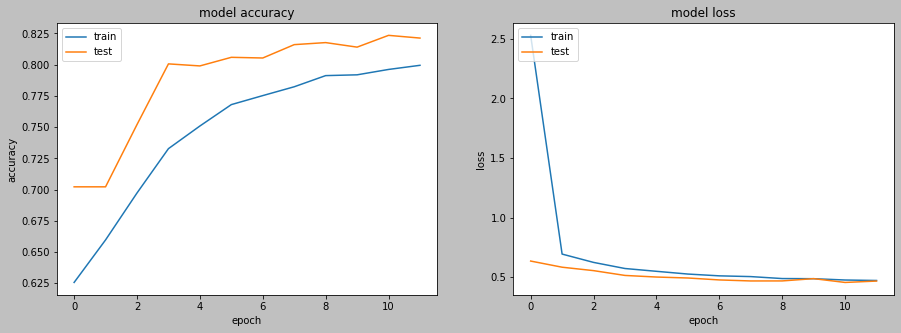

In [ ]:
import matplotlib.pyplot as plt

def plot_los():
  fig = plt.figure(figsize=(15, 5)).patch.set_facecolor('silver')
  plt.subplot(121)

  plt.plot(hstry.history['binary_accuracy'])
  plt.plot(hstry.history['val_binary_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  
  plt.subplot(122)
  plt.plot(hstry.history['loss'])
  plt.plot(hstry.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

plot_los()

**OBSERVATION**

1. initially in epoch loss curve training loss is higher than validation loss that means underftting, which is quite evident as it is starting stage, but after epoch 3, validation loss is higher than training loss indicates model starts overftting, but epoch 3 is the best balance we are looking for.

In [ ]:
y_pred = model_1_gv.predict(test_pad, batch_size=64)
y_class = class_conversion(y_pred)

In [ ]:
y_class

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.],
       ...,
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.]])

In [ ]:
metrics(y_test, y_class)

Hamming Loss      :  0.17872031901395685
Exact Match Ratio :  0.5807504078303426
Recall micro      :  0.4759586122945831
Precision micro   :  0.8621830209481808
Fl score micro    :  0.6133333333333334
 
Recall macro      :  0.4251440207546156
Precision macro   :  0.906938178107208
Fl score macro    :  0.5019284156956152


In [ ]:
model_1_gv.save('/content/gdrive/MyDrive/cs1/model1_gv_deepl.h5')

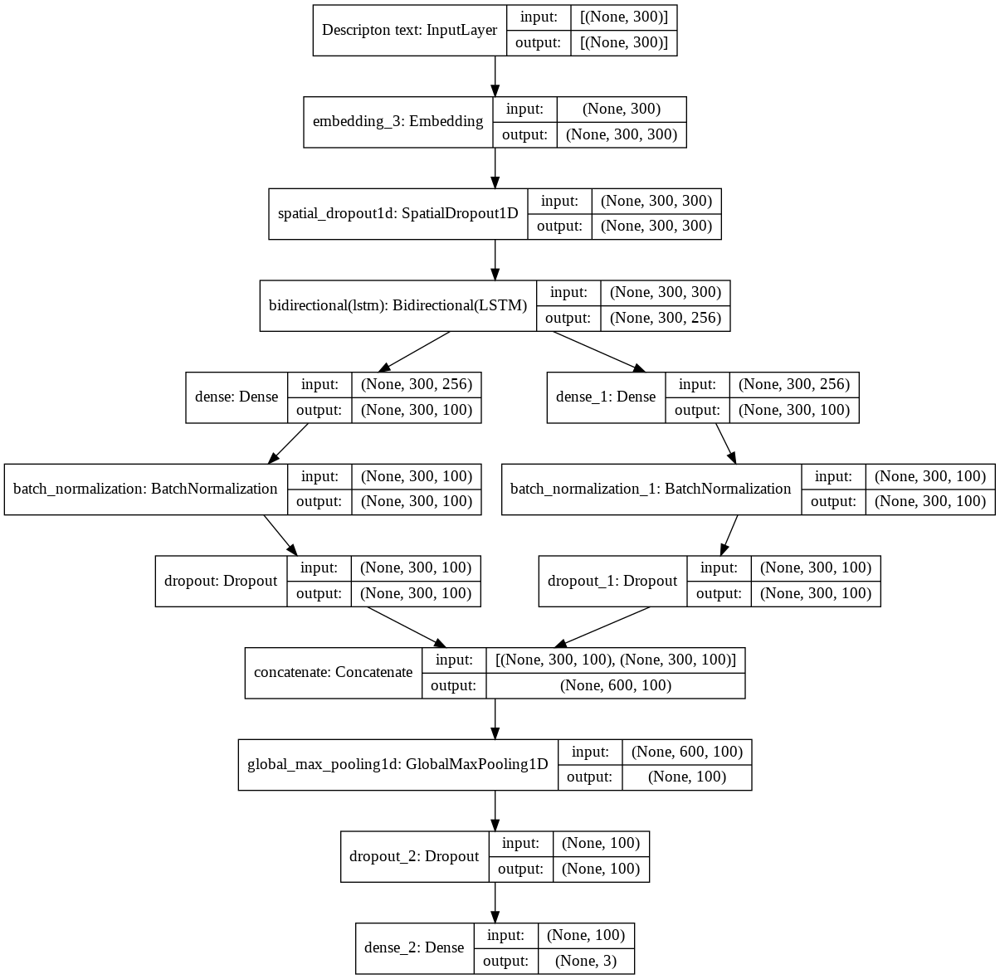

In [ ]:
tf.keras.utils.plot_model( model_1_gv, show_shapes=True, show_layer_names=True, rankdir="TB", expand_nested=False, dpi=96)

###cnn 1d

In [ ]:

def model2gv(embed_matrix, vocab_size, embedd_size,input_length):
  input = Input(shape=(300,), name='Descripton text cnn1d')  # input 

  embedding = Embedding(vocab_size, embedd_size, weights=[embed_matrix], input_length=embedd_size, trainable=False)(input)  # embedding layer

  x = SpatialDropout1D(0.5)(embedding)
  conv0 = Conv1D(128, 6, activation="relu")(x)
  z = GlobalMaxPool1D()(conv0)

  conv1 = Conv1D(128, 6, activation="relu")(x)
  x1 = GlobalMaxPool1D()(conv1)

  x1 = Concatenate()([x1,z])

  x2 = Dropout(0.5)(x1)

  output = Dense(3, activation="sigmoid")(x2)

  model_2_gv = Model(inputs=input, outputs=output)

  return model_2_gv

  #model_2_ft.summary()

In [ ]:
model_2_gv = model2gv(embedding_matrix_ft, vocab_size, 300, 300)
model_2_gv.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Descripton text cnn1d (InputLay [(None, 300)]        0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 300, 300)     2420100     Descripton text cnn1d[0][0]      
__________________________________________________________________________________________________
spatial_dropout1d_2 (SpatialDro (None, 300, 300)     0           embedding_2[0][0]                
__________________________________________________________________________________________________
conv1d_3 (Conv1D)               (None, 295, 128)     230528      spatial_dropout1d_2[0][0]        
____________________________________________________________________________________________

In [ ]:
from tensorflow.keras.callbacks import *

filepath = '/content/gdrive/MyDrive/cs1/deep_model210_gv.hdf5'
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1,save_best_only=True, mode='auto', save_freq='epoch')

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
model_2_gv.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=[tf.keras.metrics.BinaryAccuracy()])

hstry1 = model_2_gv.fit(train_pad, y_train, batch_size=64, epochs=12, validation_data=(test_pad, y_test), callbacks=[checkpoint])

Epoch 1/12
115/115 [==============================] - 95s 821ms/step - loss: 0.5583 - binary_accuracy: 0.7420 - val_loss: 0.4642 - val_binary_accuracy: 0.8013

Epoch 00001: val_loss improved from inf to 0.46417, saving model to /content/gdrive/MyDrive/cs1/deep_model210_gv.hdf5
Epoch 2/12
115/115 [==============================] - 94s 818ms/step - loss: 0.4747 - binary_accuracy: 0.7929 - val_loss: 0.4413 - val_binary_accuracy: 0.8222

Epoch 00002: val_loss improved from 0.46417 to 0.44125, saving model to /content/gdrive/MyDrive/cs1/deep_model210_gv.hdf5
Epoch 3/12
115/115 [==============================] - 94s 816ms/step - loss: 0.4473 - binary_accuracy: 0.8066 - val_loss: 0.4297 - val_binary_accuracy: 0.8314

Epoch 00003: val_loss improved from 0.44125 to 0.42973, saving model to /content/gdrive/MyDrive/cs1/deep_model210_gv.hdf5
Epoch 4/12
115/115 [==============================] - 94s 821ms/step - loss: 0.4216 - binary_accuracy: 0.8196 - val_loss: 0.4150 - val_binary_accuracy: 0.8320

In [ ]:
score = model_2_gv.evaluate(test_pad, y_test, verbose=1)
print("Loss         :", score[0])
print("Bin. Accuracy:", score[1])

58/58 [==============================] - 9s 156ms/step - loss: 0.4088 - binary_accuracy: 0.8421
Loss         : 0.408765971660614
Bin. Accuracy: 0.8421244621276855


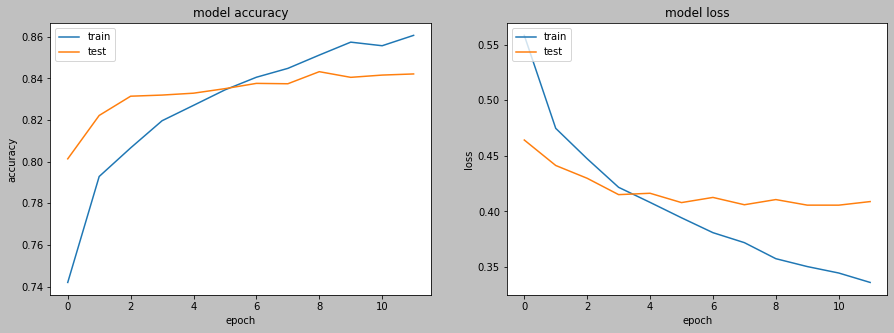

In [ ]:
import matplotlib.pyplot as plt

def plot_los():
  fig = plt.figure(figsize=(15, 5)).patch.set_facecolor('silver')
  plt.subplot(121)

  plt.plot(hstry1.history['binary_accuracy'])
  plt.plot(hstry1.history['val_binary_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  
  plt.subplot(122)
  plt.plot(hstry1.history['loss'])
  plt.plot(hstry1.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

plot_los()

**OBSERVATION**

1. initially in epoch loss curve training loss is higher than validation loss that means underftting, which is quite evident as it is starting stage, but after epoch 3, validation loss is higher than training loss indicates model starts overftting, but epoch 3 is the best balance we are looking for.

In [ ]:
y_pred = model_2_gv.predict(test_pad, batch_size=64)
y_class = class_conversion(y_pred)

In [ ]:
y_class

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.],
       ...,
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.]])

In [ ]:
metrics(y_test, y_class)

Hamming Loss      :  0.15787565705999637
Exact Match Ratio :  0.6351277868406743
Recall micro      :  0.5970785149117468
Precision micro   :  0.8243697478991596
Fl score micro    :  0.6925520649488175
 
Recall macro      :  0.568915452091274
Precision macro   :  0.8052642971288385
Fl score macro    :  0.6596601768136018


In [ ]:
model_2_gv.save('/content/gdrive/MyDrive/cs1/model2_gv_deepl.h5')

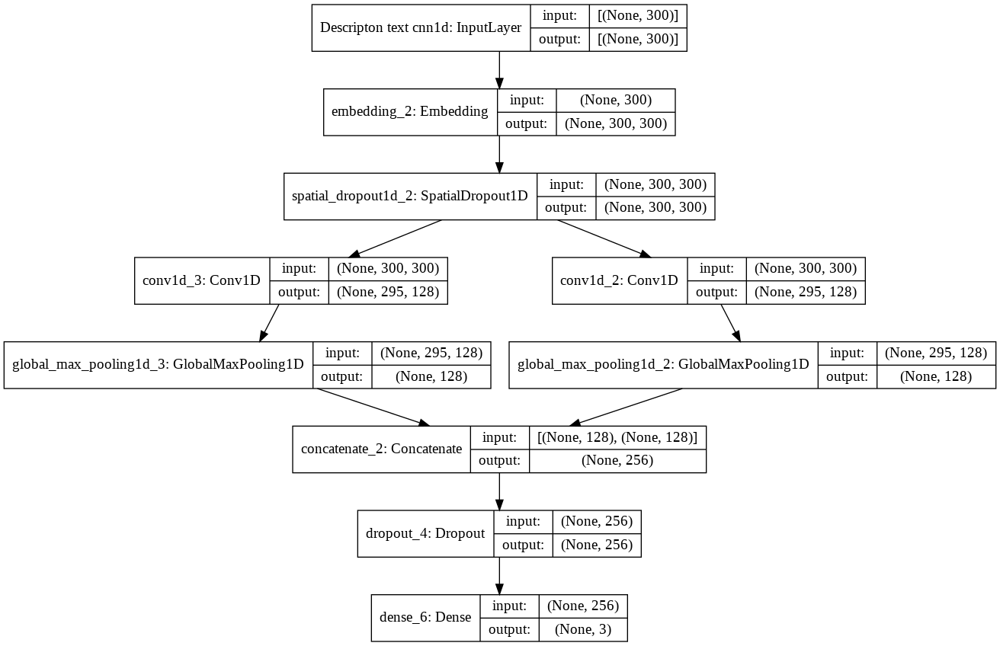

In [ ]:
tf.keras.utils.plot_model( model_2_gv, show_shapes=True, show_layer_names=True, rankdir="TB", expand_nested=False, dpi=96)

###bi dir. lstm and cnn 1d

In [ ]:
def model3gv(embed_matrix, vocab_size, embedd_size,input_length):
  input = Input(shape=(input_length,))  # input 
  embedding = Embedding(vocab_size, embedd_size, weights=[embed_matrix], input_length=input_length, trainable=False)(input)  # embedding layer

  x = SpatialDropout1D(0.2)(embedding)

  x = Bidirectional(LSTM(128, return_sequences=True, dropout=0.15, recurrent_dropout=0.15))(x)
  x = Conv1D(64, kernel_size=3, padding='valid', kernel_initializer='glorot_uniform')(x)

  avg_pool = GlobalAveragePooling1D()(x)
  max_pool = GlobalMaxPooling1D()(x)  

  x = concatenate([avg_pool, max_pool])
  x = BatchNormalization()(x)
  x = Dropout(0.2)(x)   
  x = Dense(128, activation='relu')(x)
  x = Dense(64, activation='relu')(x)
  out = Dropout(0.2)(x)   

  output = Dense(3, activation="sigmoid")(out)
  model_3_gv = Model(inputs=input, outputs=output)

  return model_3_gv


In [ ]:
model_3_gv = model3ft(glove_embed, vocab_size, 300, 300)
model_3_gv.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 300)]        0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 300, 300)     2420100     input_2[0][0]                    
__________________________________________________________________________________________________
spatial_dropout1d_1 (SpatialDro (None, 300, 300)     0           embedding_1[0][0]                
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 300, 256)     439296      spatial_dropout1d_1[0][0]        
____________________________________________________________________________________________

In [ ]:
from tensorflow.keras.callbacks import *

filepath = '/content/gdrive/MyDrive//cs1/deep_model3_gv.hdf5'
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1,save_best_only=True, mode='auto', save_freq='epoch')

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
model_3_gv.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=[tf.keras.metrics.BinaryAccuracy()])

hstry2 = model_3_gv.fit(train_pad, y_train, batch_size=64, epochs=12, validation_data=(test_pad, y_test), callbacks=[checkpoint])

Epoch 1/12
115/115 [==============================] - 385s 3s/step - loss: 0.5071 - binary_accuracy: 0.7706 - val_loss: 0.5095 - val_binary_accuracy: 0.8084

Epoch 00001: val_loss improved from inf to 0.50947, saving model to /content/gdrive/MyDrive//cs1/deep_model3_gv.hdf5
Epoch 2/12
115/115 [==============================] - 376s 3s/step - loss: 0.4321 - binary_accuracy: 0.8205 - val_loss: 0.4282 - val_binary_accuracy: 0.8314

Epoch 00002: val_loss improved from 0.50947 to 0.42822, saving model to /content/gdrive/MyDrive//cs1/deep_model3_gv.hdf5
Epoch 3/12
115/115 [==============================] - 376s 3s/step - loss: 0.4082 - binary_accuracy: 0.8333 - val_loss: 0.4050 - val_binary_accuracy: 0.8351

Epoch 00003: val_loss improved from 0.42822 to 0.40496, saving model to /content/gdrive/MyDrive//cs1/deep_model3_gv.hdf5
Epoch 4/12
115/115 [==============================] - 375s 3s/step - loss: 0.3941 - binary_accuracy: 0.8409 - val_loss: 0.3905 - val_binary_accuracy: 0.8387

Epoch 000

In [ ]:
score = model_3_gv.evaluate(test_pad, y_test, verbose=1)
print("Loss         :", score[0])
print("Bin. Accuracy:", score[1])

58/58 [==============================] - 18s 310ms/step - loss: 0.5214 - binary_accuracy: 0.8209
Loss         : 0.5214168429374695
Bin. Accuracy: 0.8209170699119568


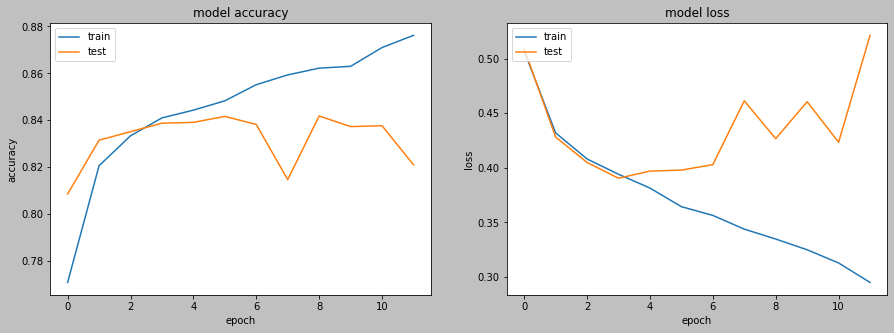

In [ ]:
import matplotlib.pyplot as plt

def plot_los():
  fig = plt.figure(figsize=(15, 5)).patch.set_facecolor('silver')
  plt.subplot(121)

  plt.plot(hstry2.history['binary_accuracy'])
  plt.plot(hstry2.history['val_binary_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  
  plt.subplot(122)
  plt.plot(hstry2.history['loss'])
  plt.plot(hstry2.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()

plot_los()

**OBSERVATION**

1. initially in epoch loss curve training loss is at par with validation loss that means no underftting no overfitting, but after epoch 3, validation loss is higher than training loss indicates model starts overftting, but epoch 3 is the best balance we are looking for.

In [ ]:
y_pred = model_3_gv.predict(test_pad, batch_size=64)
y_class = class_conversion(y_pred)

In [ ]:
y_class

array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 0.],
       ...,
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [ ]:
metrics(y_test, y_class)

Hamming Loss      :  0.17908283487402574
Exact Match Ratio :  0.5889070146818923
Recall micro      :  0.4960438222763238
Precision micro   :  0.8358974358974359
Fl score micro    :  0.622612681436211
 
Recall macro      :  0.4756535069466062
Precision macro   :  0.7989495798319327
Fl score macro    :  0.5957652372843117


In [ ]:
model_3_gv.save('/content/gdrive/MyDrive/cs1/model3_gv_deepl.h5')

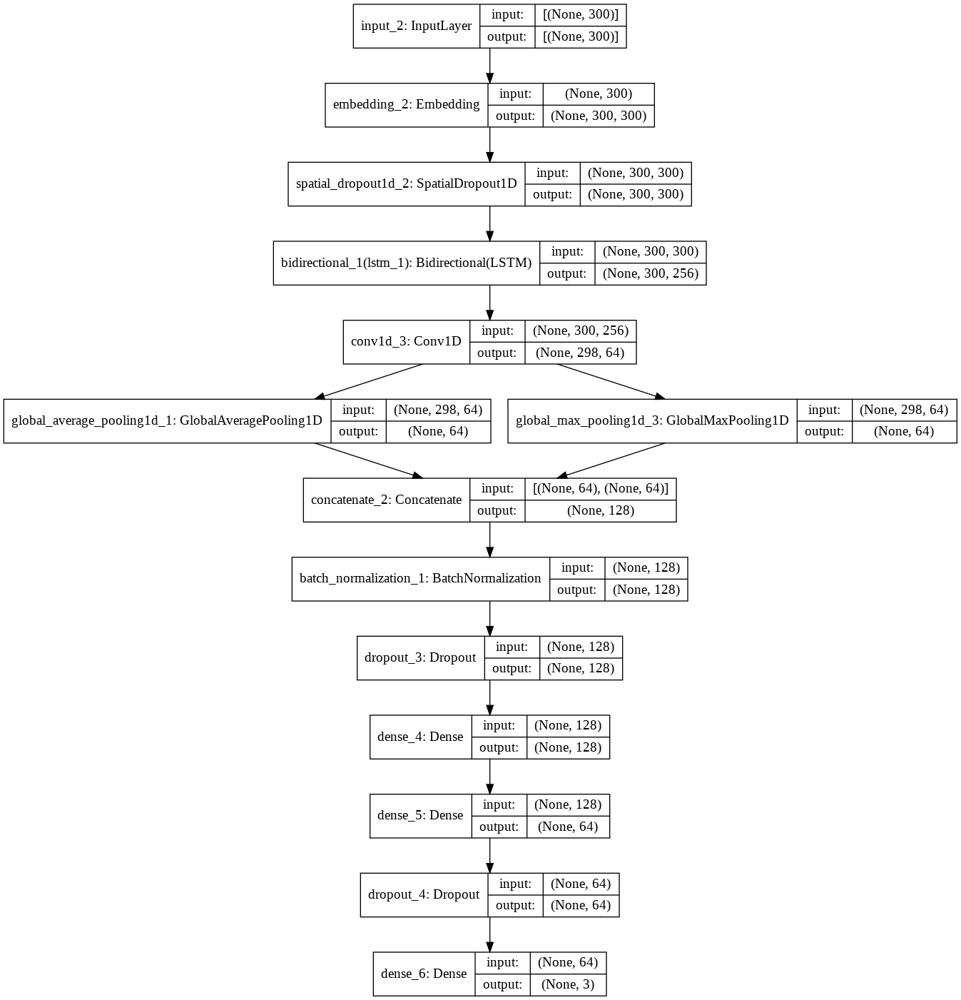

In [ ]:
tf.keras.utils.plot_model( model_3_gv, show_shapes=True, show_layer_names=True, rankdir="TB", expand_nested=False, dpi=96)

#OVER VIEW

In [ ]:
from prettytable import PrettyTable
k6 = PrettyTable()
print(' Best from Dl ')
print('-'*15)
print(' ')
k6.field_names = ["Model","Embedding","Hamming loss","EMR","Recall","Precision","F1 score",]
k6.add_row(["Bidir. Lstm",'FASTEXT',0.1706, 0.6107, 0.5003, 0.8726, 0.6360])
k6.add_row(["CNN1D",'FASTEXT',0.1606, 0.6297, 0.5709, 0.8382, 0.6792])
k6.add_row(["Bidir. Lstm  + CNN1D",'FASTEXT',0.1599, 0.6248, 0.5721, 0.8400, 0.6806])
k6.add_row(["Bidir. Lstm",'GLOVE',0.1787, 0.5808, 0.4760, 0.8622, 0.6133])
k6.add_row(["CNN1D",'GLOVE',0.1579, 0.6351, 0.5971, 0.8244, 0.6926])
k6.add_row(["Bidir. Lstm  + CNN1D",'GLOVE',0.1791, 0.5889, 0.4960, 0.8359, 0.6226])
print(k6)

 Best from Dl 
---------------
 
+----------------------+-----------+--------------+--------+--------+-----------+----------+
|        Model         | Embedding | Hamming loss |  EMR   | Recall | Precision | F1 score |
+----------------------+-----------+--------------+--------+--------+-----------+----------+
|     Bidir. Lstm      |  FASTEXT  |    0.1706    | 0.6107 | 0.5003 |   0.8726  |  0.636   |
|        CNN1D         |  FASTEXT  |    0.1606    | 0.6297 | 0.5709 |   0.8382  |  0.6792  |
| Bidir. Lstm  + CNN1D |  FASTEXT  |    0.1599    | 0.6248 | 0.5721 |    0.84   |  0.6806  |
|     Bidir. Lstm      |   GLOVE   |    0.1787    | 0.5808 | 0.476  |   0.8622  |  0.6133  |
|        CNN1D         |   GLOVE   |    0.1579    | 0.6351 | 0.5971 |   0.8244  |  0.6926  |
| Bidir. Lstm  + CNN1D |   GLOVE   |    0.1791    | 0.5889 | 0.496  |   0.8359  |  0.6226  |
+----------------------+-----------+--------------+--------+--------+-----------+----------+


In [ ]:
k7 = PrettyTable()
print(' Best from Ml ')
print('-'*15)
print(' ')
k7.field_names = ["Model","Embedding","Hamming loss","EMR","Recall","Precision","F1 score",]
k7.add_row(["bow word + Numerical",'LOGISTIC REGRESSION',0.1684, 0.6145, 0.5977, 0.7856, 0.6789])
k7.add_row(["tf-idf word + Numerical",'LINEAR SVM',0.1727, 0.6057, 0.5879, 0.7777, 0.6697])
k7.add_row(["tf-idf char + Numerical",'LINEAR SVM',0.1731, 0.6074, 0.5618, 0.7971, 0.6591])
k7.add_row(["fastext + Numerical",'LOGISTIC REGRESSION',0.2021, 0.5416, 0.5399, 0.7119, 0.6140])
k7.add_row(["dl features + Numerical",'LINEAR SVM',0.2623, 0.4279, 0.4437, 0.5777, 0.5019])
k7.add_row(["bert + Numerical",'LOGISTIC REGRESSION',0.1990, 0.5579, 0.5587, 0.7111, 0.6258])
print(k7)

 Best from Ml 
---------------
 
+-------------------------+---------------------+--------------+--------+--------+-----------+----------+
|          Model          |      Embedding      | Hamming loss |  EMR   | Recall | Precision | F1 score |
+-------------------------+---------------------+--------------+--------+--------+-----------+----------+
|   bow word + Numerical  | LOGISTIC REGRESSION |    0.1684    | 0.6145 | 0.5977 |   0.7856  |  0.6789  |
| tf-idf word + Numerical |      LINEAR SVM     |    0.1727    | 0.6057 | 0.5879 |   0.7777  |  0.6697  |
| tf-idf char + Numerical |      LINEAR SVM     |    0.1731    | 0.6074 | 0.5618 |   0.7971  |  0.6591  |
|   fastext + Numerical   | LOGISTIC REGRESSION |    0.2021    | 0.5416 | 0.5399 |   0.7119  |  0.614   |
| dl features + Numerical |      LINEAR SVM     |    0.2623    | 0.4279 | 0.4437 |   0.5777  |  0.5019  |
|     bert + Numerical    | LOGISTIC REGRESSION |    0.199     | 0.5579 | 0.5587 |   0.7111  |  0.6258  |
+------------

In [ ]:
##chossing cnn1 d glove

**OBSERVATION**

Q. reason why hamming loss has decreased but with no increase in F1 score?

The reason hamming loss is decreasing but not substantial increase in f1 is due to reason that hamming loss evaluates row wise at a time (i.e change in row element row wise) there is no compulsion of tp,fp,fn in hamming loss its just bit of 0's and 1's, the bits might have change in any order it is still considered in hamming loss,  but f1-micro considers comparison of actual and predicted with individual column wise (which have tp, fp, fn), i.e investigates label wise relationship (which is much stricter than previous one).

e.x.


```
actual     predicted    hamming loss           p,        r,            f1-micro
 
[1,0,1]    [1,1,1]       1 bit 0.337          2/2+0=1    2/2+1 = 0.667   0.80
[1,0,0]    [1,1,1]       2 bit 0.667          1/1+0=1    1/1+2 = 0.667   0.80
                        avg 1/2 = 0.5                                   avg 0.80
```

from the above example it is clear that individual and avg hamming loss is less than f1-micro (individual and avg) is almost same i.e avg hamming loss decrease but no increase in f1-micro. 


##END 2 END PIPLINE

In [ ]:
lemmatizer = WordNetLemmatizer()
def preprocess(text):
    
    """performs common expansion of english words, preforms preprocessing"""

    text = re.sub(r"won\'t", "will not", text)   # decontracting the words
    text = re.sub(r"can\'t", "can not", text)
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)

    text = re.sub(r'\w+:\s?','',text)                                            ## removing anyword:
    text = re.sub('[([].*?[\)]', '', text)                                       ## removing sq bracket and its content
    text = re.sub('[<[].*?[\>]', '', text)                                       ## removing <> and its content
    text = re.sub('[{[].*?[\}]', '', text)                                       ## removing {} and its content
    
    text = ' '.join([lemmatizer.lemmatize(word) for word in text.split()])       ## lemmatizing the word

    text = re.sub(r'\W', ' ', str(text))                                         # Remove all the special characters
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text)                                  # remove all single characters 
    text = re.sub(r"[^A-Za-z0-9]", " ", text)                                    # replace all the words except "A-Za-z0-9" with space  
    text = re.sub(r'[^\w\s]','',text)
    text = ' '.join(e for e in text.split() if e.lower() not in set(stopwords.words('english')) and len(e)>2)  
    # convert to lower and remove stopwords discard words whose len < 2
    
    text = re.sub("\s\s+" , " ", text)                                           ## remove extra white space  lst
    text = text.lower().strip()   

    return text


In [ ]:
pickle.dump((tokenizer), open('/content/gdrive/MyDrive/cs1/tokenizer.pkl','wb'))

In [ ]:
##load from pickle tokenizer model
##load tensorflow keras numpy pandas, padd sequences
def end_to_end_pipeline(string):
  path = '/content/gdrive/MyDrive/cs1/deep model final/model2_gv_deepl.h5'
  result = []
  x = preprocess(string)
  sent_token = tokenizer.texts_to_sequences([x])

  sent_token_padd = pad_sequences(sent_token, maxlen=300, dtype='int32', padding='post', truncating='post')
  model = tf.keras.models.load_model(path)
  pred = model.predict(sent_token_padd)
  
  row, column = pred.shape
  predict = np.zeros((row, column))
  for i in range(row):
    for j in range(column):
      if pred[i,j]>0.5:
        predict[i,j] = 1
  
  for k in range(predict.shape[0]):
    if predict[k][0] == 1.0:
      result.append('commenting')
    if predict[k][1] == 1.0:
      result.append('ogling')
    if predict[k][2] == 1.0:
      result.append('groping')
    if np.sum(predict) == 0.0:
      result.append('None')
    
  print(f'possible action : {result}')

In [ ]:
query_1 = 'During morning, a woman was walking and thin guy came around and called her names, and commented on her body.'
end_to_end_pipeline(query_1)

possible action : ['commenting']


In [ ]:
query_2 = 'During morning, a woman was walking by and thin guy came and groped her.'
end_to_end_pipeline(query_2)

possible action : ['groping']


In [ ]:
query_3 = 'During morning, a woman was walking by and thin guy was staring at her.'
end_to_end_pipeline(query_3)

possible action : ['ogling']


In [ ]:
query_4 = 'During morning, a woman was walking by and thin guy came and did nothing to her.'
end_to_end_pipeline(query_4)

possible action : ['None']


In [ ]:
query_5 = 'Catcalls and passing comments were two of the ghastly things the Delhi police at the International Airport put me and my friend through. It is appalling that the protectors and law enforcers at the airport can make someone so uncomfortable.'
end_to_end_pipeline(query_5)

possible action : ['commenting']


In [ ]:
query_6 = 'This incident took place in the evening.I was in the metro when two guys started staring.'
end_to_end_pipeline(query_6)

possible action : ['ogling']


In [ ]:
query_7 = 'Was walking along crowded street, holding mums hand, when an elderly man groped butt, I turned to look at him and he looked away, and did it again after a while.I was 12 yrs old then.'
end_to_end_pipeline(query_7)

possible action : ['groping']


In [ ]:
query_8 = 'chain snatching evening punjabi bagh bus stop'
end_to_end_pipeline(query_8)

possible action : ['None']


In [ ]:
query_9 = 'Was walking along crowded street, holding mums hand, when an elderly man groped butt, I turned to look at h7m and he looked away, and did it again after a while.I was 12 yrs old then.'
end_to_end_pipeline(query_9)

possible action : ['groping']


In [ ]:
query_10 = 'witnEsseD incident chaIn9 brutALLy snatched elderly lady incident tok pla$Ce even!ing'
end_to_end_pipeline(query_10)

possible action : ['None']


In [ ]:
query_11 = 'incident kap0Pened inMide tRaI*n'
end_to_end_pipeline(query_11)

possible action : ['None']


##LIME

###LIME THEORY

1. Local Interpretable Model Agnostic Explanation, that is technique that provides plausible reasoning why any given model chooses that particular class/prediction. This also helps as to trust classifier or not, it may be good classifier but its prediction is absurd, not relatable to given task, the whole purpose of machine learning automation goes for toss, providing reasoning is much required in critical fields like medicine, legal etc. 

2. In classical ml, in most algorithms provides explanation via feature importance, but this feature importance computed considering all the data/global structure. Local interpretable means it should look/consider only neighborhood of given point, not all the inputs, it is highly likely in local region we have high probability of explanation as it is linear in nature (weights can be easily calculated), but this doesn’t mean that local region does not have non-linearity in that case this technique performs not that good.

3. Key idea is separate all those points which are in neighborhood, by fitting simple models (many name this simple model as surrogate model which means close approximation of original task) which are interpretable (i.e. we can get weights which eventually leads to feature importance), and this simple model is approximate of the given/original fitted model only in domain of neighborhood, it achieves the task with sampling points around input neighborhood, give more weightage to near points than far points.

4. 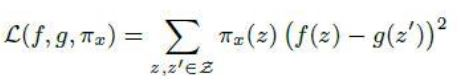


Here, πx(z): proximity function that calculate distance between x and z.
ℒ (f, g, πx): L is loss function which minimizes approximation of function g to function f in neighborhood of x.
f(z): original model prediction on z
g(z’): model prediction on z’, where z’ is in neighborhood of x’ which in turn neighborhood of x, z’ indicates samples around x’.
x’: it is neighborhood of x which indicate that particular feature/word is present or not.

###WORKING

In [ ]:
pip install lime

     |████████████████████████████████| 275 kB 8.8 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=ce399fb045eb681777d221b9d063b407854cab561a29e653e12fe6057f160b0e
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
  model = tf.keras.models.load_model('/content/gdrive/MyDrive/cs1/deep model final/model2_gv_deepl.h5')
  #k = model.predict(test_pad)

In [ ]:
def raw_to_probab(pred):

  '''take prediction and return mormalized value for its row'''
  
  p0 = []
  for j in range(pred.shape[0]):
    for i in pred[j]:
      p0.append(i/sum(pred[j]))

  return np.array(p0, dtype='float32').reshape(-1,3)


In [ ]:
#https://github.com/marcotcr/lime/issues/409

from lime.lime_text import LimeTextExplainer
model = tf.keras.models.load_model('/content/gdrive/MyDrive/cs1/deep model final/model2_gv_deepl.h5')
def multi_label_explain(text, labels, features, samples):

    '''take text : string of info,
    labels       : labels,
    features     : no. of features to be consider while explaining,
    sample       : no. of neighbourhood samples to be tken for lime explanation,
    each label and give explaintion for that label with focused words'''


    for label in labels:
        class_names = ['others', label]

        def make_classifier_pipeline(label=label):
          label_index = labels.index(label)
          # pick the corresponding output node 
          def lime_explainer_pipeline(texts):    
            x_sequence = tokenizer.texts_to_sequences(texts)
            x_sequence = pad_sequences(x_sequence, maxlen=300, padding='post', truncating='post')
            predict_probs = model.predict(x_sequence)
            prd_p = raw_to_probab(predict_probs)
            prob_true = prd_p[:, label_index]
            result = np.transpose(np.vstack(([1-prob_true, prob_true])))  
            result  = result.reshape(-1, 2)
            print(result.shape)
            return result
        
          return lime_explainer_pipeline

        classifer_fn = make_classifier_pipeline(label=label)
        explainer = LimeTextExplainer(class_names=class_names, kernel_width=25, bow=True)
        exp = explainer.explain_instance(text, classifer_fn, num_features=features, num_samples=samples)
        exp.show_in_notebook(text=True, predict_proba=True)
  

In [ ]:
labels = ['commenting', 'ogling', 'groping']
r = 'During morning, a woman was walking by and thin guy came.'
mle = multi_label_explain(r, labels, 20, 500)

(500, 2)


(500, 2)


(500, 2)


In [ ]:
r0 = 'Catcalls and passing were two of the ghastly things the Delhi police at the International Airport put me and my friend through. It is appalling that the protectors and law enforcers at the airport can make someone so uncomfortable.'
labels = ['commenting', 'ogling', 'groping']
mle = multi_label_explain(r0, labels, 20, 500)


(500, 2)


(500, 2)


(500, 2)


In [ ]:
r = 'Was walking along crowded street, holding mums hand, when an elderly man groped butt, I turned to look at h7m and he looked away, and did it again after a while.I was 12 yrs old then.'
x_sequen = tokenizer.texts_to_sequences([r])
x_sequen = pad_sequences(x_sequen, maxlen=300, padding='post', truncating='post')
pdt = model.predict(x_sequen)
pdt

array([[0.02093241, 0.06269768, 0.9715594 ]], dtype=float32)

In [ ]:
pdt.shape

(1, 3)

In [ ]:
pt = raw_to_probab(pdt)
pt

array([[0.01983758, 0.05941841, 0.920744  ]], dtype=float32)

**OBSERVATION**

1. since we have used sigmoid as final layer, to get probablity for each class/label we have to normalize each entry by its row sum, that is what function raw to probablity is doing.

2. other label indictes labels other than which is present on right side. ex if right side commenting, than others will have ogling and groping (we cannot determine individual percentage in others).

3. in first output, During morning, a woman was walking by and thin guy came. 



```
               percent  word model think imp. 
   commenting - 38% -    walking, morning
   ogling     - 30% -    women, mornng
   groping    - 32% -    came
```